# 🎓 **Homework #2. Snakemake** 🎓

---

### 👤 **Assigner**:  
**Malkova Ksenia**

### ✍️ **Contacts**:  
- [kemalkova@edu.hse.ru](mailto:kemalkova@edu.hse.ru)

- [@ksu_marshmallow](https://t.me/ksu_marshmallow)

### 🔥 **Deadline** 🔥:  

- **15.12.2024**

---

## Theory  <font color=#c30>[2]</font>

**Question #1**

>What are [computer ports](https://www.cloudflare.com/learning/network-layer/what-is-a-computer-port/) on a high level? How many ports are there on a typical computer? <font color=#c30>[0.4]</font>

**Answer #1**

**Компьютерные порты** - виртуальные "входы и выходы" для обмена данными между устройствами и приложениями. Они позволяют разделять потоки информации, чтобы каждое приложение могло получить только предназначенные ему данные. Порт выступает как адрес для конкретного процесса (веб-браузер, почтовая программа или игра). Например, при подключении к интернету порт помогает системе определить, какое приложение должно обработать входящий трафик. 

Каждый порт идентифицируется номером, который определяет его "назначение":
1. **Системные порты** (0–1023) - зарезервированы для стандартных сервисов и системных процессов (порт 80 - HTTP, порт 22 - SSH)
2. **Зарегистрированные порты** (1024–49151) - назначаются для работы приложений и сервисов (базы данных, игровые серверы, почта)
3. **Динамические** или **частные порты** (49152–65535) - используются временно для клиентских приложений (браузеры, мессенджеры). Они выделяются операционной системой автоматически и освобождаются после завершения соединения

Порты определяются в рамках транспортного уровня (#4) модели OSI (Open Systems Interconnection). Протоколы транспортного уровня (TCP и UDP) используют 16 бит для хранения номера порта $\to$ $2^{16}=65.536$ возможных значений портов. 

---

**Question #2**

>What is Nginx? How does it work on the high level? List several alternative web servers. <font color=#c30>[0.4]</font>

**Answer #2**

**Nginx** - это один из самых популярных веб-серверов, который используется для обработки запросов пользователей и обслуживания сайтов. Веб-сервер — это программа, которая "слушает" запросы от пользователей и отвечает на них. Nginx также может быть прокси-сервером, что значит, что он может перенаправлять запросы на другие серверы.

Когда кто-то заходит на сайт, например, отправляет запрос на его главную страницу, Nginx может либо **самостоятельно обработать этот запрос** (например, если нужно отдать картинку или текстовый файл), либо **передать запрос другому серверу**, если для этого запроса нужна сложная обработка (например, для отображения информации на динамической странице)

Особенность Nginx в том, что он использует **асинхронную модель обработки запросов**. Это значит, что, в отличие от некоторых других серверов, Nginx не создаёт отдельный процесс для каждого запроса. Вместо этого один процесс может обрабатывать сразу несколько запросов одновременно (параллельно), что делает работу сервера гораздо быстрее.

**Как работает Nginx:**
1. **Мастер-процесс** запускает сам Nginx. Он выполняет такие задачи, как открытие портов для связи и загрузку конфигурации. После этого мастер-процесс запускает несколько дочерних процессов, которые будут непосредственно работать с запросами.
2. **Загрузчик кэша** запускается, чтобы загрузить кэшированные данные из диска в оперативную память
3. **Кэш-менеджер** работает периодически и удаляет старые или ненужные данные из кэша, чтобы его объем не становился слишком большим.
4. **Рабочие процессы** занимаются обработкой запросов пользователей, а также взаимодействием с другими сервером и хранящимися данными. Каждый рабочий процесс работает независимо и может обрабатывать несколько запросов одновременно.
5. **Обработка запросов** - когда новый запрос поступает в систему, рабочий процесс обрабатывает его и решает, что с ним делать. Рабочий процесс не ждет ответа от клиента (неблокирующий режим), а сразу переходит к следующему запросу

**Альтернативы nginx:**
1. **Apache (Apache HTTP Server)**
2. **LiteSpeed** 
3. **Caddy** 
4. **Cherokee**
5. **Tomcat** – предназначен в первую очередь для Java-приложений
6. **Lighttpd**

Some resources:
1. [Статья habr](https://habr.com/ru/articles/260065/)
2. [Yandex Practicum](https://practicum.yandex.ru/blog/chto-takoe-nginx/)

---

**Question #3**

>What is SSH, and for what is it typically used? Explain two ways to authenticate in an SSH server in detail. <font color=#c30>[0.4]</font>

**Answer #3**

Как гласит википедия, «SSH — сетевой протокол прикладного уровня, позволяющий производить удалённое управление операционной системой и туннелирование TCP-соединений (например, для передачи файлов). Схож по функциональности с протоколами Telnet и rlogin, но, в отличие от них, шифрует весь трафик, включая и передаваемые пароли. SSH допускает выбор различных алгоритмов шифрования. SSH-клиенты и SSH-серверы доступны для большинства сетевых операционных систем». 

Для чего используется:
1. **Доступ к удаленному серверу** - чаще всего
2. **Доступ к терминалу удаленной машины по шифрованному каналу** (замена telnet)
3. **Обеспечить обмен файлами с удаленной машиной** по шифрованному каналу (заменить ftp) и без необходимости обходить ограничения, которые присущи ftp при работе через NAT и прокси
4. **Проброс портов** - обеспечить доступ к портам с локальной машины или ее сети на порты, которые доступы удаленной машине
5. **Работа на удаленной машине** - выполнение команд на удаленной машине из скриптов локальной машины

Самое главное, что SSH обеспечивает **безопасность** соединения с удаленной машиной с помощью различных алгоритмов шифрования. Вся пересылаемая информация между узлами находится внутри зашифрованного туннеля.

Для подключения к SSH-серверу необходимо пройти аутентификацию, чтобы убедиться, что подключается именно тот пользователь, который имеет на это право. Два способа аутентификации:
1. **С помощью пароля** - при подключении к SSH-серверу, клиент должен ввести свой логин и пароль. Но пароли могут быть угаданы или украдены, что, конечно, снижает безопасность
2. **С помощью ключей ssh** - используется пара криптографических ключей: *приватный ключ* (остается на клиенте) и *публичный ключ* (хранится на сервере). Это значительно более безопасный способ аутентификации. Более того, не нужно каждый раз вводить пароль! И запоминать тоже :)
    - Публичный ключ добавляется в файл `authorized_keys` на сервере, а приватный ключ остается у клиента (не передается по сети)
    - При попытке подключения сервер проверяет, соответствует ли приватный ключ клиента публичному. При мэтчинге пускает пользователя на сервер


Some resources:
1. [habr](https://habr.com/ru/articles/802179/)

---

**Question #4**

>What is a pipeline (in bioinformatics)? Why are they so popular in bioinformatics and not in other areas? <font color=#c30>[0.4]</font>

**Answer #4**

Пайплайн - это цепочка программ и инструментов, которые объединяются для обработки и анализа данных. Каждый инструмент выполняет свою задачу (например, в биоинформатике - сортировку, фильтрацию, выравнивание или аннотацию), а результаты передаются следующему инструменту, создавая последовательность действий. Такой подход позволяет автоматизировать сложные процессы, что сильно упрощает работу с большими объемами данных.

**Основные особенности пайплайнов**
1. **Детерминированность** - при одинаковых входных данных результат будет всегда одинаковым $\to$ обеспечивает воспроизводимость
2. **Кэширование** - пайпы пересчитывают только те этапы, которые зависят от измененных параметров $\to$ экономия времени
3. **Масштабируемость** - пайплайн гораздо легче адаптировать для работы с большими объемами данных по сравнению с кастомным (и скорее всего костыльным) кодом
4. **Гибкость и простота настройки** - благодаря конфигам можно гибко настраивать параметры, не прибегая к переписыванию кода

**Почему пайплайны так популярны в биоинформатике**
1. **Мы - биологи!** Без пайплайнов биологам нужно либо писать код с нуля, либо разбираться в чужих скриптах, что часто требует глубоких знаний программирования. Пайпы позволяют минимизировать технические сложности, делая доступным анализ (скорее всего своих же) данных для биологов и исследователей с разным уровнем технической подкованности
2. **Экономия времени и ресурсов** - вместо того, чтобы разрабатывать каждый этап анализа вручную, можно использовать готовые решения, что позволяет сосредоточиться на научной части работы, а не технической реализации
3. **Стандартизация и надежность** - публичные пайплайны проходят проверку сообществом, что гарантирует их надежность
4. **Общие протоколы и процессы** - многие пайплайны следуют общепринятым стандартам, что как минимум позволяет сравнивать результаты различных исследований. Более того, легче перескочить с одного пайплайна на другой (быстро разобраться в новом пайплайне, если ты похожий уже видел)
5. **Расширенные возможности** - некоторые пайплайны поддерживают интеграцию с облачными вычислениями или большими базами данных, что может быть сложно реализовать вручную

---

**Question #5**

>Explain how Snakemake and Nextflow work on the high level. I.e., what are their general paradigms? <font color=#c30>[0.4]</font>

**Answer #5**

**Snakemake** и **Nextflow** - тулы для разработки и автоматизации биоинформатических пайплайнов

1. **Snakemake**

Snakemake использует парадигму, основанную на **правилах** (rules). Каждое правило в Snakemake описывает шаг пайплайна, например, выравнивание данных или аннотацию. Эти правила определяют, какие файлы являются входами и выходами для каждого шага, и автоматически строится **граф выполнения** (DAG), который определяет порядок выполнения задач в зависимости от их зависимостей. Система управляет зависимостями между шагами и параллелизмом, что позволяет эффективно распределять вычисления

Основная идея Snakemake - **автоматическое управление зависимостями и параллельными вычислениями**. Программа сама решает, какой шаг выполнить первым, а какой можно запустить параллельно. Это удобно, так как позволяет эффективно использовать ресурсы и гарантирует воспроизводимость результатов.

| Преимущества | Недостатки |
| ------------ | ---------- | 
| Легко настроить и использовать для стандартных задач | Требует изучения синтаксиса (но мне кажется, что если пишешь скрипты на bash, то перейти очень даже легко) |
| Встроенная поддержка параллелизма и распределенных вычислений | Может быть ограничен в гибкости для более сложных задач | 
| Автоматическое управление зависимостями | Меньше подходит для использования в облаке и на кластерах по сравнению с Nextflow | 


2. **Nextflow**

Парадигма Nextflow основана на **процессах** (processes) и **каналах** (channels). Каждый процесс в Nextflow представляет собой шаг пайплайна, а каналы - это механизмы передачи данных между этими шагами. Процессы могут быть легко распределены на разные вычислительные ресурсы, включая **кластеры** и **облачные платформы**

Nextflow поддерживает **контейнеризацию** (в том числе с Docker), что позволяет изолировать окружения и гарантировать совместимость между различными этапами пайплайна. Это особенно важно, когда нужно работать с разными версиями инструментов или библиотек.

| Преимущества | Недостатки |
| ------------ | ---------- | 
| Легко масштабируется на кластерах и в облаке | Требует более сложного синтаксиса, чем Snakemake |
| Поддержка контейнеров | Нужно время на изучение, особенно для новичков | 
| Высокая гибкость и возможность адаптации для сложных сценариев | Может быть избыточным для небольших задач | 

---

## Problem <font color=#c30>[6.5]</font>

A real-life situation that occurred to me several times over the years.

Imagine wrapping up a large bioinformatics project and wanting to share raw data with your colleagues in a friendly and straightforward format. The best option would be to use an online genome browser and host your data remotely, so it is easily accessible by anyone with a valid link. This is exactly what we will be doing here.

*Please consider doing this HW using Linux since setting up the SSH client on Windows is painful, and I won't be able to help you.*


### Step 1. Start virtual machine <font color=#c30>[1.5]</font>

Create a new virtual machine in the Yandex/Mail/etc cloud (order at least 10GB of free disk space). Generate SSH key pair and use it to connect to your server.

1. **Создание VM на YandexCloud**

Сделала платежный аккаунт, создала новое облако и внутри него создала каталог (`chip-atac`)

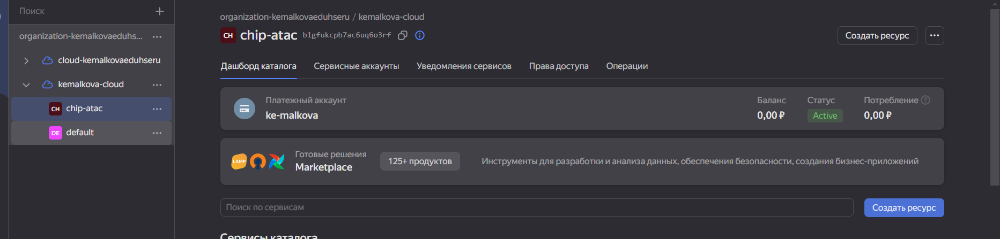

После создаем VM: 
- в разделе виртуальные машины (Colmpute Cloud) создаем VM
- в качестве ОС выбираем Ubuntu 24.04
- Обойдемся 2 cpu по дефолту
- Размер диска 20 Гб по дефолту

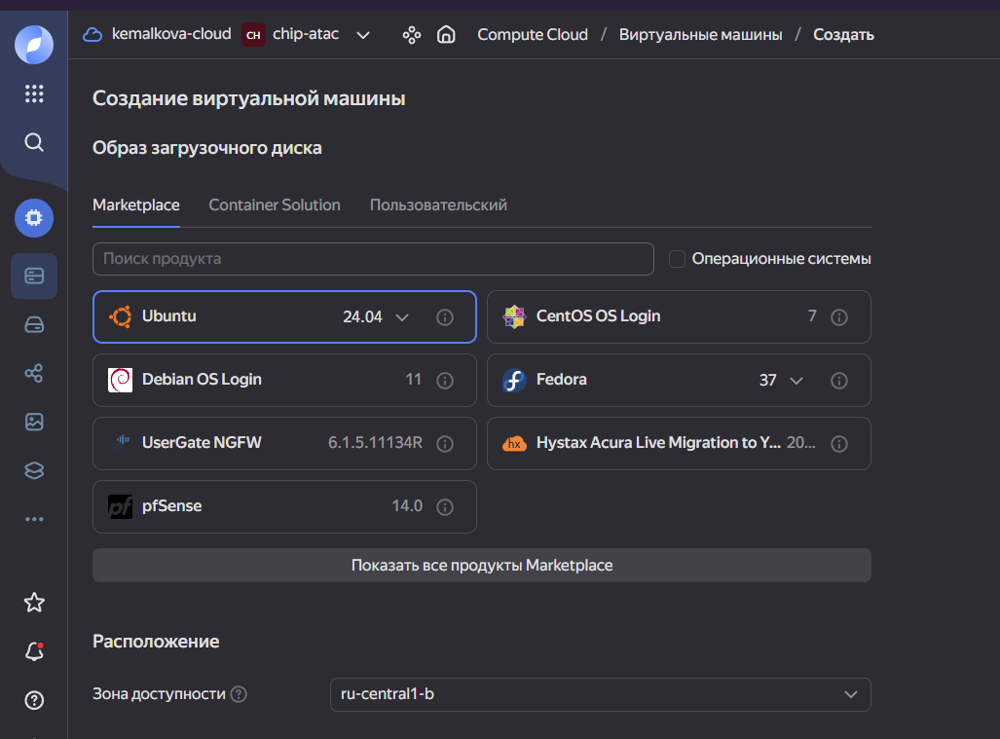

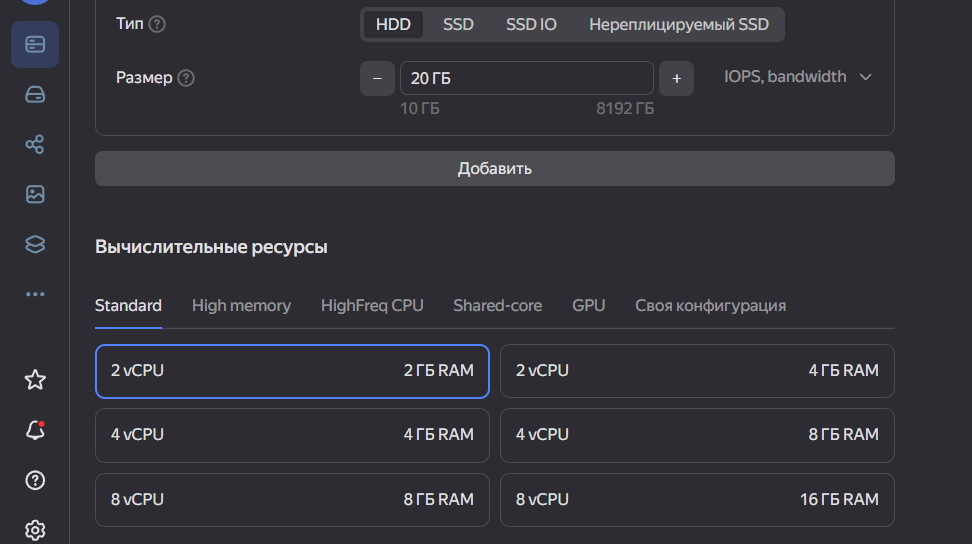

2. **Генерация ключей**

Вообще у меня уже есть своя пара публичный-приватный ключ, но сгенерить можно было как-то так

```bash
ssh-keygen -t rsa -b 4096
```
- `-t` - алгоритм для генерации ключа
- `-b` - размер ключа

Копируем публичный ключ отсюда:

```bash
cat ~/.ssh/mykey.pub
```

И вставляем ssh-ключ в yandex cloud. После создаем ВМ. Вот, что вышло:

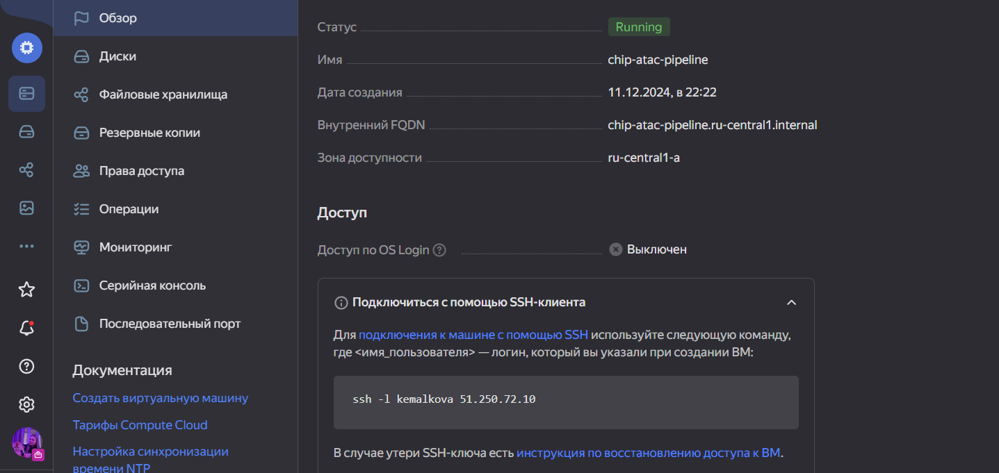

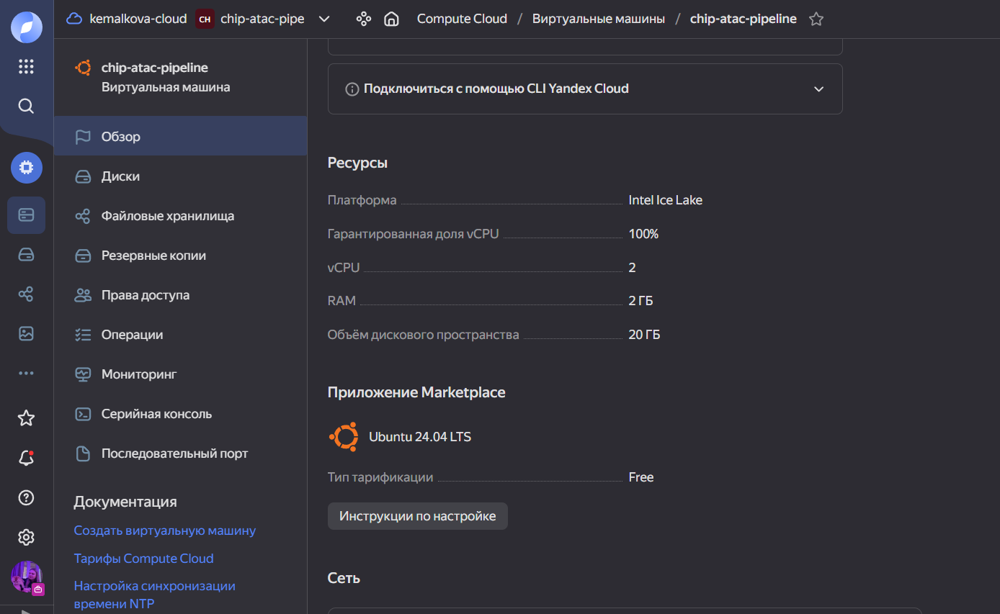

P.S.: это уже третья за дз vm

Можно подключиться как 

```bash
ssh -l kemalkova 51.250.72.10 -i ~/.ssh/mykey 
```

Но мы же продвинутые, поэтому зашла в `~/.ssh/config/` и написала такое незамысловатое чудо, чтобы потом ip-адрес сервака не писать, а заходить только по имени

```bash
Host chip
   Hostname 51.250.72.10
   User kemalkova
   IdentityFile ~/.ssh/mykey
```

Пробуем подключиться 

```bash
ssh chip
```

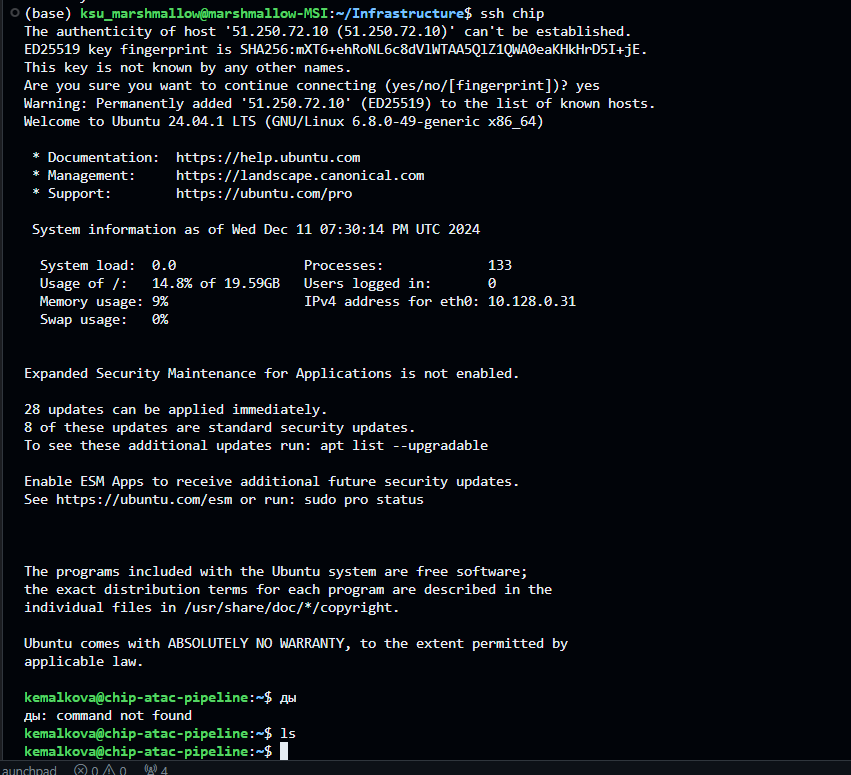

congrats

---

### Step 2. Start JBrowse repository <font color=#c30>[1]</font>

Download and install [JBrowse 2](https://jbrowse.org/jb2/). Create a new jbrowse [repository](https://jbrowse.org/jb2/docs/cli/#jbrowse-create-localpath) in `/mnt/JBrowse/` (or some other folder).

**TIP**  One of the possible way is via [npm](https://www.npmjs.com/package/@jbrowse/cli). Do not forget `jbrowse create JBrowse`

1. **Установка node.js**

```bash
    sudo apt update
    sudo apt install nodejs npm
```

check installation:

```bash
    node -v
    npm -v
```

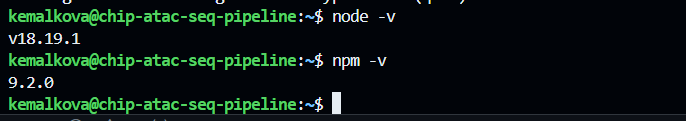

2. **Установка JBrowse CLI**

```bash
    sudo npm install -g @jbrowse/cli
```

Проверяем утановку:

```bash
    jbrowse --version
```

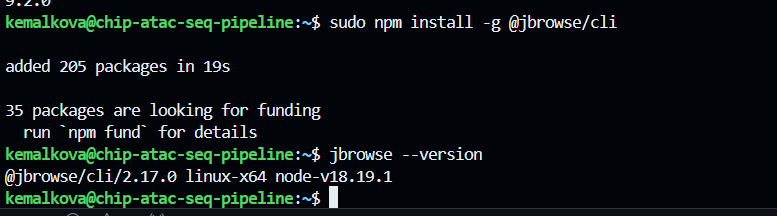

3. **Создание репозитория JBrowse**

```bash
    sudo jbrowse create /mnt/ChIP-ATAC-pipe
```

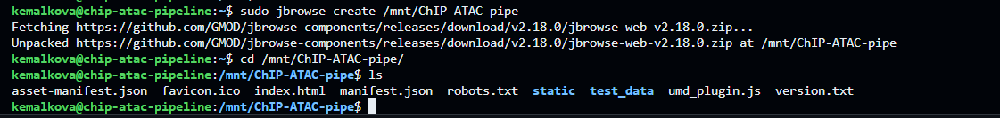

---

### Step 3. nginx <font color=#c30>[1]</font>

<font color=#c30>[0.5]</font> Install nginx and change its config(/etc/nginx/nginx.conf)

Установка nginx

```bash
    sudo apt update
    sudo apt install nginx
```

Редактируем конфиг:

```bash
    sudo nano /etc/nginx/nginx.conf
```

```json
http {
  ...
  include /etc/nginx/conf.d/*.conf;
  #include /etc/nginx/sites-enabled/*;

  server {
          listen 80;
          index index.html;
          server_name 51.250.72.10;

          location /jbrowse/ {
                  alias /mnt/ChIP-ATAC-pipe/;
          }
  }
  ...
}
```

<font color=#c30>[0.5]</font> Restart the nginx (reload its config) and make sure that you can access the browser using a link

Рестарт:

```bash
    sudo systemctl restart nginx
```

АААААААА сработало!!!

http://51.250.72.10/jbrowse/

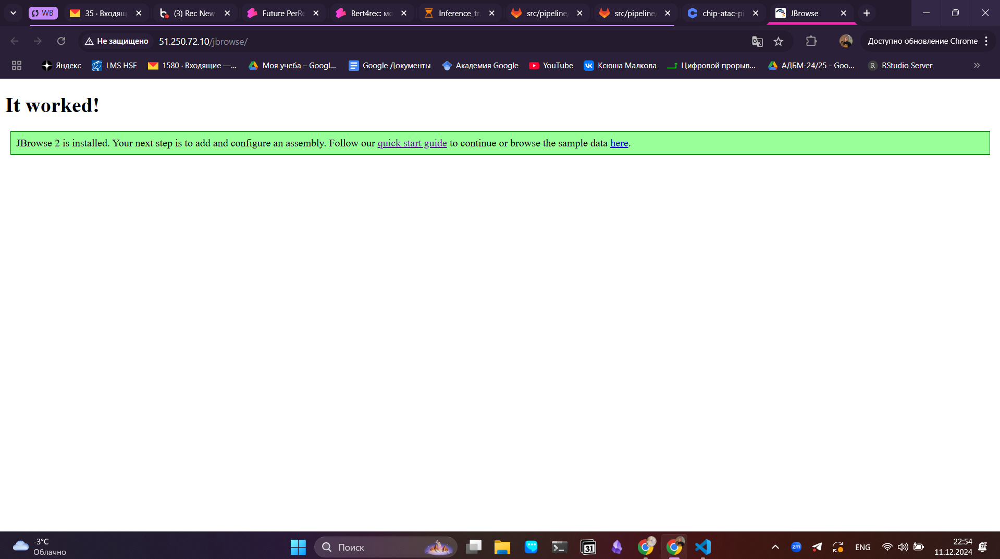

---

### Step 4. Load Reference human genome <font color=#c30>[1]</font>

Download the latest human genome assembly (GRCh38) from the Ensemble FTP server ([fasta](https://ftp.ensembl.org/pub/release-108/fasta/homo_sapiens/dna/Homo_sapiens.GRCh38.dna.primary_assembly.fa.gz), [GFF3](https://ftp.ensembl.org/pub/release-108/gff3/homo_sapiens/Homo_sapiens.GRCh38.108.gff3.gz)). Index the fasta using samtools (`samtools faidx`) and GFF3 using tabix.

Сначала скачиваем нужные тулзы

```bash
sudo apt update
sudo apt install samtools tabix gzip
```

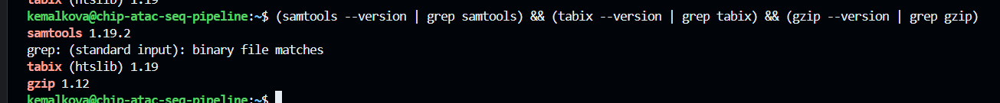

Я устала для любой команды писать sudo в этой папке, поэтому разрешила себе запускать без sudo каждый `cp`,  `mv` и прочее

```bash
    sudo chown -R $(whoami):$(whoami) /mnt/ChIP-ATAC-pipe/
```

Не зря же мы делали HW1 - теперь умеем писать скрипты и понимаем, что это круто. Поэтому не будем делать это через CLI, а напишем bash-скрипт. Да и мне это будет полезно, потому что могу переделывать задание несколько раз - и чтобы каждый раз 10 команд не вводить, легче будет каждый раз запускать только скрипт. Если какая-то команды вдруг в нем не нужна, можно будет закомментировать. 

В общем, Sobstvenno script:

```bash
#!/bin/bash

data_folder=${1:-data}
prefix=${2:-reference_hg38}

mkdir -p "$data_folder"

# Download files
echo "Downloading reference human genome to the $data_folder directory..."

wget -O "$data_folder/$prefix.fa.gz" "https://ftp.ensembl.org/pub/release-108/fasta/homo_sapiens/dna/Homo_sapiens.GRCh38.dna.primary_assembly.fa.gz"
wget -O "$data_folder/$prefix.gff3.gz" "https://ftp.ensembl.org/pub/release-108/gff3/homo_sapiens/Homo_sapiens.GRCh38.108.gff3.gz"

echo "Contents of $data_folder after downloading: $(ls $data_folder)"

# Unpack files and fix some gff3 bags
gunzip "$data_folder/$prefix.fa.gz"
zcat "$data_folder/$prefix.gff3.gz" | grep -v "^#" | sort -t$'\t' -k1,1 -k4,4n | bgzip > "$data_folder/$prefix.sorted.gff3.gz"

# Index files
echo "Indexing the fasta file..."
samtools faidx "$data_folder/$prefix.fa"

echo "Indexing the gff3 file..."
tabix -p gff "$data_folder/$prefix.sorted.gff3.gz"

echo "Contents of $data_folder after processing: $(ls $data_folder)"
```

- Просто wget'ом скачали файлы в нашу папочку
- Разархивировали фасту
- Отсортировали gff3 по рекомендации (только сделала это с `.gff3.gz` напрямую через `zcat`, чтобы лишний раз не разархивировать, это и место занимает + долго)
- Проиндексировали фасту (`samtools faidx`) и gff3 (`tabix -p gff`). Флаг `-p` указывает на расширение файла (preset = Input format for indexing)

И оно запустилось с первого раза!! (но сам скрипт запускала десятки раз)

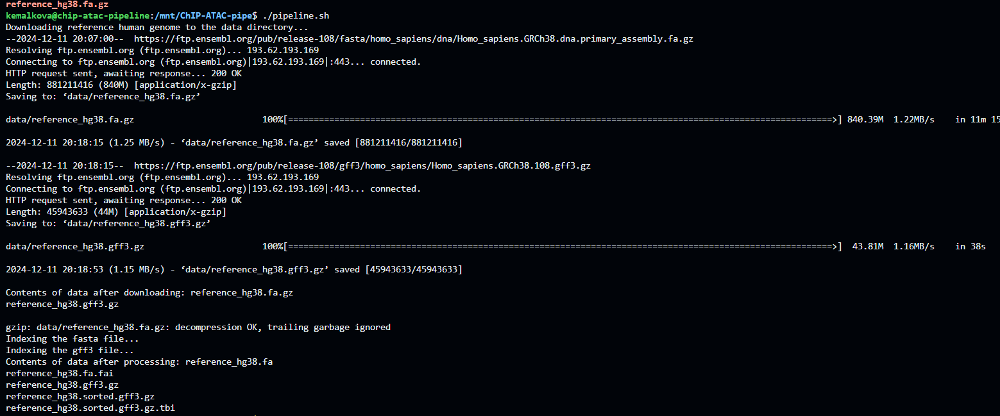

---

### Step 5. Load ChIP- and ATAC-seq <font color=#c30>[1]</font>

Select and download BED files for three ChIP-seq and one ATAC-seq experiment from the ENCODE (use one tissue/cell line). Sort, bgzip, and index them using tabix.

Мультивселенная домашек

Cell line: [**K562**](https://en.wikipedia.org/wiki/K562_cells) - leukemia cell line (erythroleukemia type)

1. **ATAC-seq**:
    - [ENCODE ATAC-seq experiment](https://www.encodeproject.org/experiments/ENCSR868FGK/)
    - [conservative IDR thresholded peaks](https://www.encodeproject.org/files/ENCFF855PCP/@@download/ENCFF855PCP.bed.gz) in `bed narrowPeak` (`.bed.gz`)
2. **MNT**: 
    - [ENCODE CHIP-seq experiment](https://www.encodeproject.org/experiments/ENCSR979QYJ/)
    - [conservative IDR thresholded peaks](https://www.encodeproject.org/files/ENCFF986SXD/@@download/ENCFF986SXD.bed.gz) in `bed narrowPeak` (`.bed.gz`)
3. **NONO**: 
    - [ENCODE CHIP-seq experiment](https://www.encodeproject.org/experiments/ENCSR886RYH/)
    - [conservative IDR thresholded peaks](https://www.encodeproject.org/files/ENCFF708JRU/@@download/ENCFF708JRU.bed.gz) in `bed narrowPeak` (`.bed.gz`)
4. **REST**: 
    - [ENCODE CHIP-seq experiment](https://www.encodeproject.org/experiments/ENCSR054JMQ/)
    - [conservative IDR thresholded peaks](https://www.encodeproject.org/files/ENCFF572YTS/@@download/ENCFF572YTS.bed.gz) in `bed narrowPeak` (`.bed.gz`)

Еще один скрипт:

```bash
#!/bin/bash

data_folder=${1:-data}
mkdir -p "$data_folder"

encode_ids=(
  "ENCFF855PCP"
  "ENCFF986SXD"
  "ENCFF708JRU"
  "ENCFF572YTS"
)

# Download files
echo "Downloading ATAC-seq and ChIP-seq data..."
for id in "${encode_ids[@]}"; do
  wget -P "$data_folder" "https://www.encodeproject.org/files/$id/@@download/$id.bed.gz" -q
done

echo "Contents of $data_folder adter downloading:  $(ls $data_folder)"

# Sort, compress and index
for file in "$data_folder"/*.bed.gz; do
  echo "Sorting $file..."
  sorted_file="${file%.bed.gz}.sorted.bed.gz"
  zcat "$file" | sed 's/^chr//' | sort -k1,1 -k2,2n -k6,6 | bgzip > "$sorted_file"

  echo "Indexing $sorted_file..."
  tabix -p bed "$sorted_file"

  echo "Remove initial .bed"
  rm "$file"
done

echo "Contents of $data_folder after .bed processing:  $(ls -lh $data_folder)"
```

- Вводим список из нужных encode-id
- В цикле скачиваем wget'ом `.bed.gz` также в нашу папку с данными. Только здесь флаг `-P` использую - указываю на директорию, куда класть файл, так как переименовывать я его не собираюсь
- После скачивания всех файлов снова циклом проходимся по скачанным файлам, убираем приставку `chr`, сортируем `.bed` ([украла тут](https://davetang.org/muse/2013/11/20/sorting-a-huge-bed-file/)). Но по сути сначала сортируем по первому столбцу (хромосомы или контиги), а потом по стартовой позиции в уже отсортированных хромосомах (второй столбец, `n` означает числовую сортировку). И на всякий случай по шестому полю с ориентацией региона (+ или -). После сортировки все снова сжимаем и перенаправляем в отсортированный файл. 
- Индексируем отсортированную сжатую кровать
- И удаляем изначальный `.bed.gz`

Ребята я в ударе

Логи, конечно, так себе (можно части было разделять что-то типа линией и вообще содержимое папки не показывать), но оно работает и Бога Славу

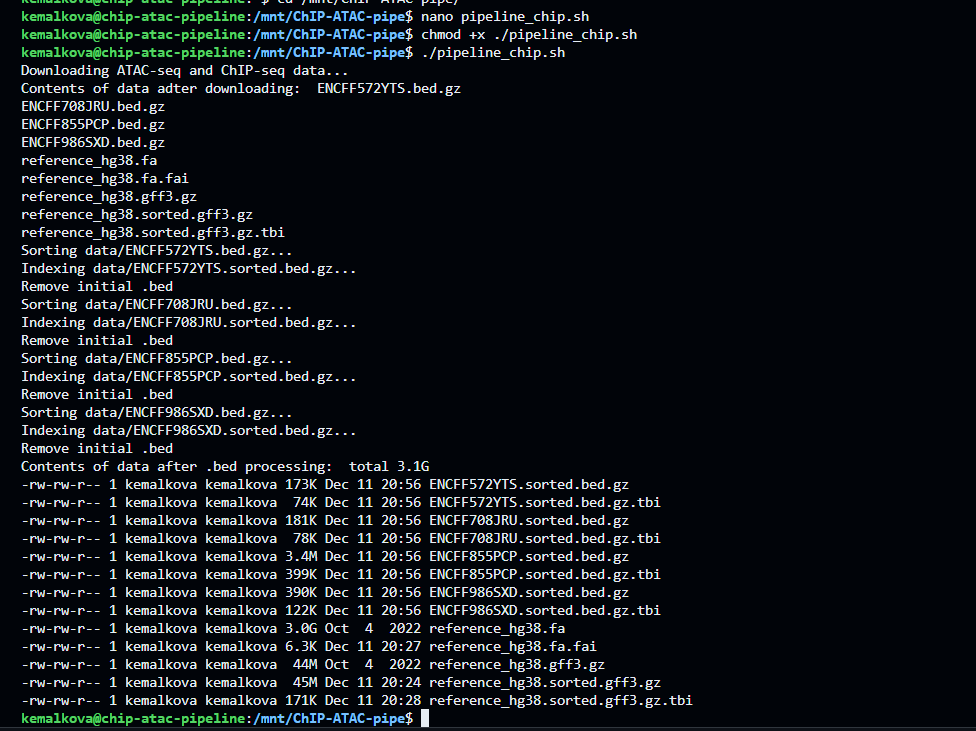

---

### Step 6. Upload to Genome browser <font color=#c30>[1]</font>
[Add](https://jbrowse.org/jb2/docs/cli/) your files to the genome browser and verify that everything works as intended. Don't forget to [index](https://jbrowse.org/jb2/docs/cli/#jbrowse-text-index) the genome annotation, so you could later search by gene names.

Грех и для этой вещи не написать скрипт

```bash
#!/bin/bash

data_folder=${1:-data}
reference_prefix=${2:-reference_hg38}
encode_ids=(
  "ENCFF855PCP"
  "ENCFF986SXD"
  "ENCFF708JRU"
  "ENCFF572YTS"
)

echo "Upload reference genome"
jbrowse add-assembly $data_folder/$reference_prefix.fa --load symlink --force

echo "Upload annotation"
jbrowse add-track $data_folder/$reference_prefix.sorted.gff3.gz --trackType "FeatureTrack" --name "Gene Annotations" --load symlink --force
jbrowse text-index

echo "Upload ChIP- & ATAC-seq data"
for encode_id in "${encode_ids[@]}"; do
  echo "Adding $encode_id..."
  jbrowse add-track "$data_folder/$encode_id.sorted.bed.gz" --name "$encode_id" --load symlink --force
done
```

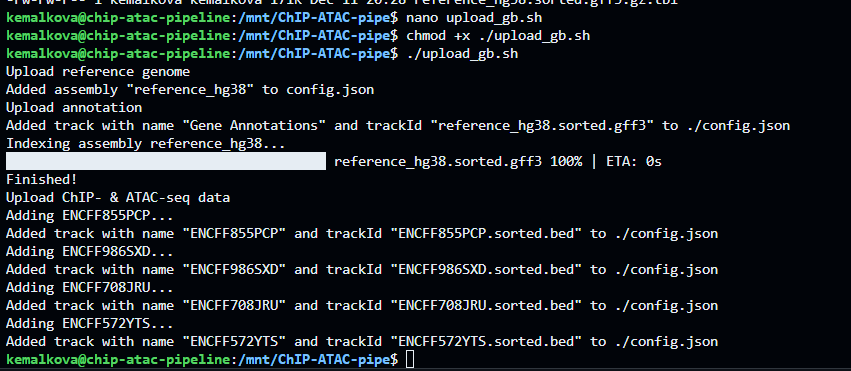

**Remember to put a persistent link to a session with all your BED files and the genome annotation in the report. I must be able to access it without problems.**

Сервер: http://51.250.72.10/jbrowse/

Если что все файлы так называются:
- `ENCFF572YTS.sorted.bed.gz` (+`.tbi`)
- `ENCFF708JRU.sorted.bed.gz` (+`.tbi`)
- `ENCFF855PCP.sorted.bed.gz` (+`.tbi`)
- `ENCFF986SXD.sorted.bed.gz` (+`.tbi`)
- `reference_hg38.fa` (+`.fai`)
- `reference_hg38.sorted.gff3.gz` (+`.tbi`)

In [4]:
SERVER_URL = 'http://51.250.72.10/jbrowse/'
REF_PREFIX = 'reference_hg38'
CHIP_ATAC_IDS = ('ENCFF572YTS', 'ENCFF708JRU', 'ENCFF986SXD', 'ENCFF855PCP')  # the last is ATAC

print('Reference and annotation files:')
for suffix in ('.fa', '.fa.fai', '.sorted.gff3.gz', '.sorted.gff3.gz.tbi'):
    print(f'{SERVER_URL}{REF_PREFIX}{suffix}')

print('\n ChIP- and ATAC-seq files:')

for encode_id in CHIP_ATAC_IDS:
    print(f'{SERVER_URL}{encode_id}.sorted.bed.gz')
    print(f'{SERVER_URL}{encode_id}.sorted.bed.gz.tbi')

Reference and annotation files:
http://51.250.72.10/jbrowse/reference_hg38.fa
http://51.250.72.10/jbrowse/reference_hg38.fa.fai
http://51.250.72.10/jbrowse/reference_hg38.sorted.gff3.gz
http://51.250.72.10/jbrowse/reference_hg38.sorted.gff3.gz.tbi

 ChIP- and ATAC-seq files:
http://51.250.72.10/jbrowse/ENCFF572YTS.sorted.bed.gz
http://51.250.72.10/jbrowse/ENCFF572YTS.sorted.bed.gz.tbi
http://51.250.72.10/jbrowse/ENCFF708JRU.sorted.bed.gz
http://51.250.72.10/jbrowse/ENCFF708JRU.sorted.bed.gz.tbi
http://51.250.72.10/jbrowse/ENCFF986SXD.sorted.bed.gz
http://51.250.72.10/jbrowse/ENCFF986SXD.sorted.bed.gz.tbi
http://51.250.72.10/jbrowse/ENCFF855PCP.sorted.bed.gz
http://51.250.72.10/jbrowse/ENCFF855PCP.sorted.bed.gz.tbi


Большой брат следит за вами в `/var/log/nginx/access.log`

Сорян за качество, но пришлось пожертвовать, чтобы она не весила больше, чем весь этот блокнот

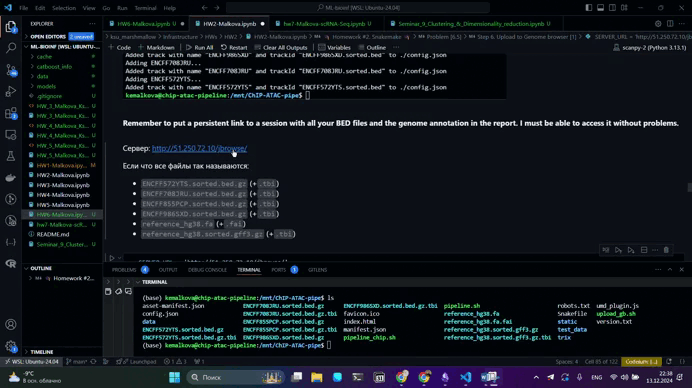

**Сессия**

http://51.250.72.10/jbrowse/?session=share-364vc8-Gue&password=17PoD

---

## Extra points <font color=#c30>[1.5]</font>

### Snakemake pipeline <font color=#c30>[1.25]</font>
Wrap 3 last steps into Snakemake pipeline.

**TIP:** You may have the rules below. 
1. Rule to add assembly to JBrowse. 
2. Rule to process and add tracks to JBrowse. 
3. Rule to add GFF3 track to JBrowse. 
4. Rule to add BED tracks to JBrowse.

1. Устанавливаем конду

    ```bash
        wget https://repo.anaconda.com/miniconda/Miniconda3-py310_22.11.1-1-Linux-x86_64.sh
        bash Miniconda3-py310_22.11.1-1-Linux-x86_64.sh
        source ~/.bashrc
    ```

2. Добавляем канал `conda-forge` для snakemake

    ```bash
        conda config --add channels conda-forge
    ```

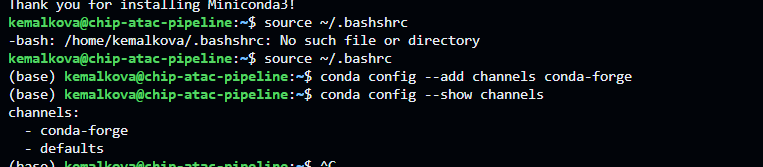

3. Делаем среду для snakemake и устанавливаем последний

    ```bash
        # create env
        conda create -c conda-forge -c bioconda -n snakemake snakemake
        # activate env
        conda activate snakemake
    ```

чекап:

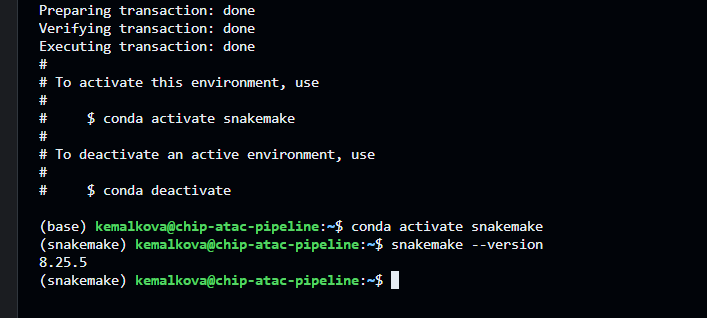

4. Сносим все, что было раньше, так как нужно же как-то работоспособность проверять (раз десятый за дз, как я сножу все + 2 раза удаляла и создавала новый сервер)

```bash
    rm *.gz *.tbi *.fa *.fa.fai
    rm -r data/
```

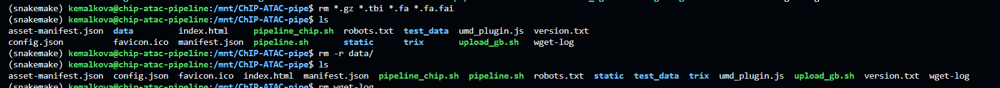

5. Создаем **Snakefile**. В него пишу все, что и было в скриптах для этого (закидываю в shell), и дописываю input и output

a) **Вводим переменные** + прописываем, что это - snakefile (# Snakefile) в первой строчке. Чтобы snakemake не потерялся и нашел нужный файл

```python
# Snakefile

DATA_FOLDER = "data"
REFERENCE_PREFIX = "reference_hg38"
ENCODE_IDS = ["ENCFF855PCP", "ENCFF986SXD", "ENCFF708JRU", "ENCFF572YTS"]
```

b) **Рул по скачиванию референса**

(`--no-clobber` чтобы не скачивать файл, если он уже есть)

```python
rule download_reference:
    output:
        fa = f"{DATA_FOLDER}/{REFERENCE_PREFIX}.fa",
        gff3 = f"{DATA_FOLDER}/{REFERENCE_PREFIX}.sorted.gff3.gz"
    shell:
        """
        mkdir -p {DATA_FOLDER}
        wget --no-clobber -O {DATA_FOLDER}/{REFERENCE_PREFIX}.gff3.gz "https://ftp.ensembl.org/pub/release-108/gff3/homo_sapiens/Ho>
        zcat {DATA_FOLDER}/{REFERENCE_PREFIX}.gff3.gz | grep -v "^#" | sort -t$'\t' -k1,1 -k4,4n | bgzip > {output.gff3}
        wget --no-clobber -O {DATA_FOLDER}/{REFERENCE_PREFIX}.fa.gz "https://ftp.ensembl.org/pub/release-108/fasta/homo_sapiens/dna>
        gunzip {DATA_FOLDER}/{REFERENCE_PREFIX}.fa.gz
        """
```

c) **Рул по индексации референса**

```python
rule index_files:
    input:
        fa = f"{DATA_FOLDER}/{REFERENCE_PREFIX}.fa",
        gff3 = f"{DATA_FOLDER}/{REFERENCE_PREFIX}.sorted.gff3.gz"
    output:
        fafai = f"{DATA_FOLDER}/{REFERENCE_PREFIX}.fa.fai",
        gff3tbi = f"{DATA_FOLDER}/{REFERENCE_PREFIX}.sorted.gff3.gz.tbi"
    shell:
        """
        samtools faidx {input.fa}
        tabix -p gff {input.gff3}
        """
```

d) **Рул для скачивания & процессинга chip-atac секов** (по установленным в начале encode ids)

```python
rule process_chip_seq_data:
    input:
        fa = f"{DATA_FOLDER}/{REFERENCE_PREFIX}.fa",
        gff3 = f"{DATA_FOLDER}/{REFERENCE_PREFIX}.sorted.gff3.gz"
    output:
        sorted_beds = [f"{DATA_FOLDER}/{encode_id}.sorted.bed.gz" for encode_id in ENCODE_IDS]
    shell:
        """
        for encode_id in {ENCODE_IDS}; do
          wget --no-clobber -P {DATA_FOLDER} "https://www.encodeproject.org/files/$encode_id/@@download/$encode_id.bed.gz" -q
          zcat {DATA_FOLDER}/$encode_id.bed.gz | sed 's/^chr//' | sort -k1,1 -k2,2n -k6,6 | bgzip > {DATA_FOLDER}/$encode_id.sorted>
          tabix -p bed {DATA_FOLDER}/$encode_id.sorted.bed.gz
          rm {DATA_FOLDER}/$encode_id.bed.gz
        done
        """
```

e) **Upload all stuff you made**. Здесь добавляем выходные файлы вне папки data, а в директорию JBrowse (их линкуем сюда в основных командах). Эти же файлы будут основными выходными в принципе для snakepipeline (так можно называть?)

```python
rule upload_to_jbrowse:
    input:
        fa = f"{DATA_FOLDER}/{REFERENCE_PREFIX}.fa",
        gff3 = f"{DATA_FOLDER}/{REFERENCE_PREFIX}.sorted.gff3.gz",
        sorted_beds = [f"{DATA_FOLDER}/{encode_id}.sorted.bed.gz" for encode_id in ENCODE_IDS],
        fafai = f"{DATA_FOLDER}/{REFERENCE_PREFIX}.fa.fai",
        gff3tbi = f"{DATA_FOLDER}/{REFERENCE_PREFIX}.sorted.gff3.gz.tbi"
    output:
        ffa_ = f"{REFERENCE_PREFIX}.fa",                                                                               
        fafai_ = f"{REFERENCE_PREFIX}.fa.fai",
        gff3_ = f"{REFERENCE_PREFIX}.sorted.gff3.gz",
        gff3tbi_ = f"{REFERENCE_PREFIX}.sorted.gff3.gz.tbi",
        sorted_beds_ = [f"{encode_id}.sorted.bed.gz" for encode_id in ENCODE_IDS],
        sorted_beds_tbi = [f"{encode_id}.sorted.bed.gz.tbi" for encode_id in ENCODE_IDS]
    shell:
        """
        jbrowse add-assembly {input.fa} --load symlink --force
        jbrowse add-track {input.gff3} --trackType "FeatureTrack" --name "Gene Annotations" --load symlink --force
        jbrowse text-index
        for file in {input.sorted_beds}; do
           encode_id=$(basename $file)
           jbrowse add-track $file --name $encode_id --load symlink --force
        done
        """
```

itog) merge all stuff we made (in the beginning of the file) - выходные файлы - то, что мы загружаем в JBrowse. На самом деле они лежат в папке data, но мы их пролинковали в изначальную папку при загрузке в jbrowse

```python
all_target_files = expand("{encode_id}.sorted.bed.gz", encode_id=ENCODE_IDS)
all_target_index_files = expand("{encode_id}.sorted.bed.gz.tbi", encode_id=ENCODE_IDS)

rule all:
    input:
        expand("{REFERENCE_PREFIX}.fa", REFERENCE_PREFIX=REFERENCE_PREFIX),
        expand("{REFERENCE_PREFIX}.fa.fai", REFERENCE_PREFIX=REFERENCE_PREFIX),
        expand("{REFERENCE_PREFIX}.sorted.gff3.gz", REFERENCE_PREFIX=REFERENCE_PREFIX),
        expand("{REFERENCE_PREFIX}.sorted.gff3.gz.tbi", REFERENCE_PREFIX=REFERENCE_PREFIX),
        all_target_files,
        all_target_index_files
```

**RUN!!!**

```bash
    snakemake --cores all
```

тут он не увидел индексирование, поэтому я еще дописывала в `all` и `upload_to_jbrowse` индексы как выходы / входы, соответственно (эта версия завершилась успешно, но на jbrowse естественно ошибка, потому что индексов ни для кого не было) 

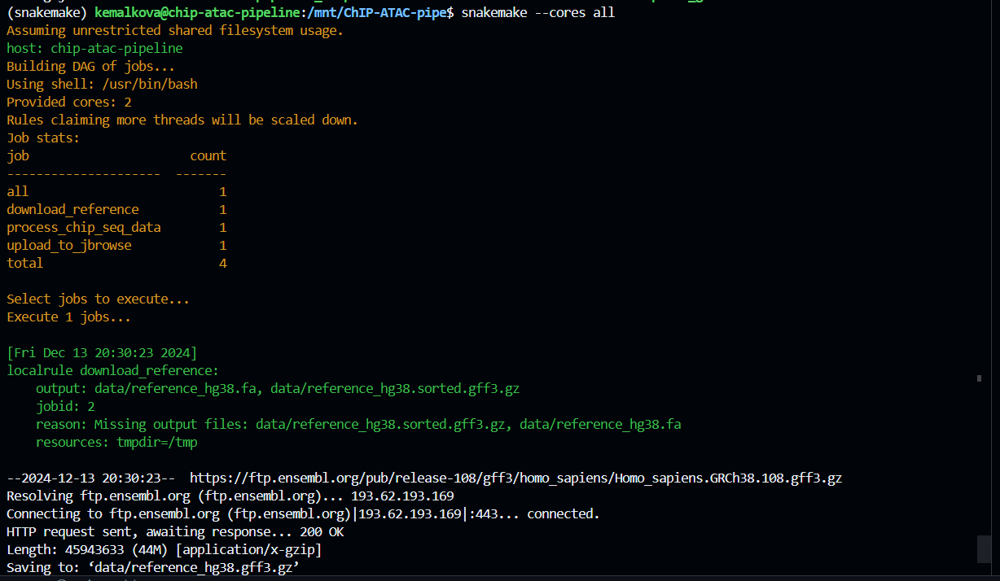

Это я дописала индексы и жду, пока оно доделается 😊

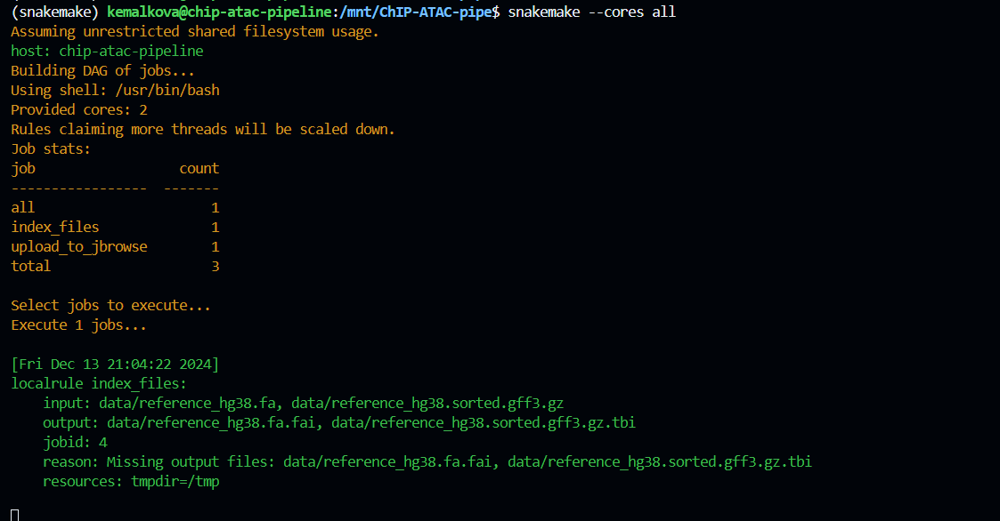

Дождалась 🥳

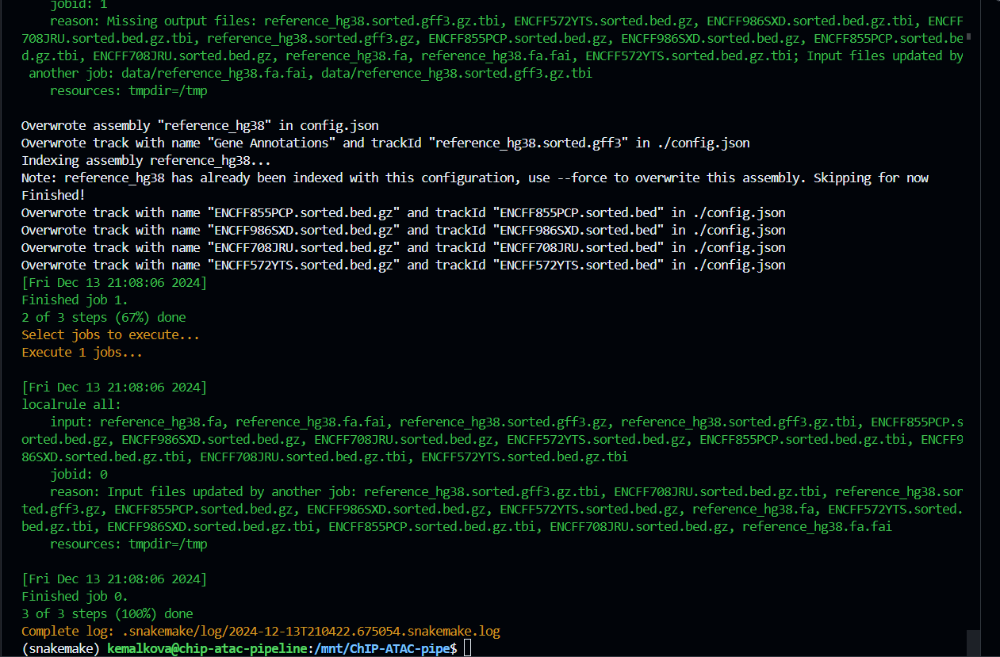

**Стрим!**

*Такая конвертация видоса в гифку гораздо быстрее, чем какими-то онлайн-тулами (ровно как и .ipynb -> html / pdf). Только тут сетка какая-то, ну и ладно

```bash
    ffmpeg -i jbrowse-snakemake.mp4 -r 5 -vf scale=1024:-1 jbrowse-snakemake.gif
```

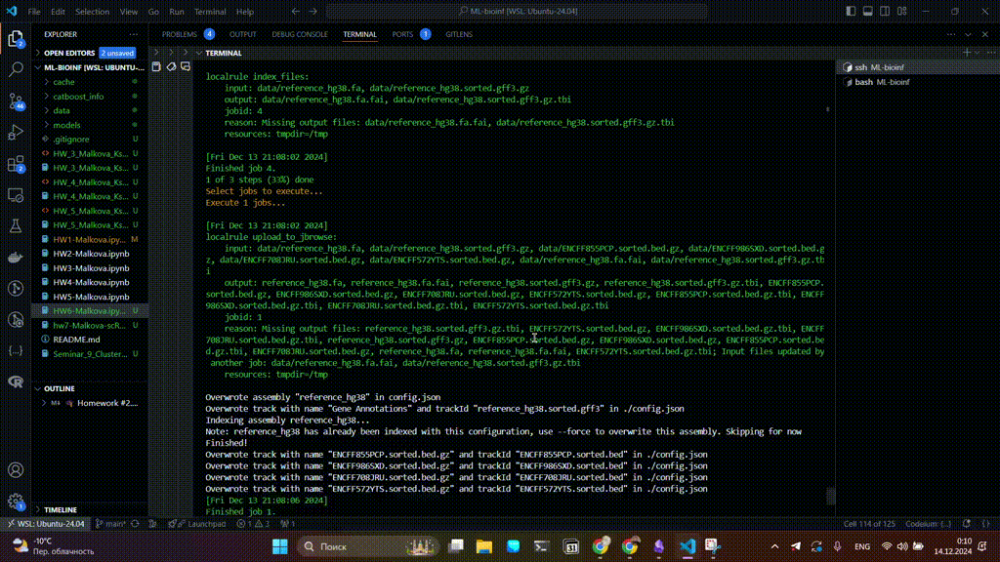

---

### Main part <font color=#c30>[0.25]</font>

Add a picture that represents your experience with this HW.

- За первые часа два я поставила сервер и загрузила файлы в JBrowser
- Следующий час не понимала, почему файлов в JBrowser не видно, хотя по прямым ссылкам на файлы они скачиваются
- Десять раз меняла конфиги, пути к файлам, прогоняла весь пайп еще раза три
- В последний прогон каким-то чудом закончилась память на сервере, папка с файлами была одна и весила она ~5 Гб. Чем занялись другие 10 Гб я так и не выяснила (`du sbh`, `ls -lah` и прочие вещи не показывали тяжеловесных вещей...). Занимать все пространство на сервере я умею:

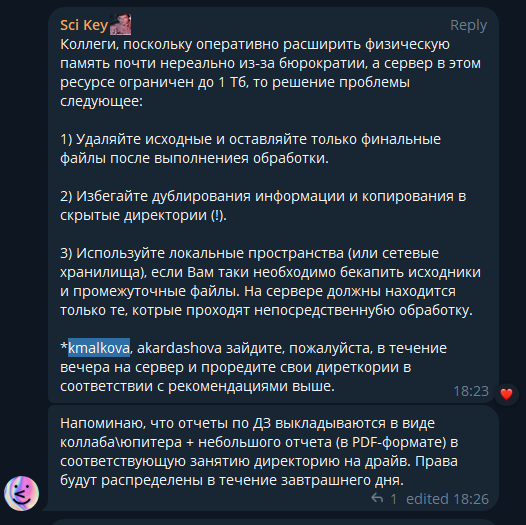

- Решила снести все, в т.ч. и пакеты. В итоге я снесла настолько все, что даже `ls` и `cd` не работали. 

![[comp.gif]](comp.gif)

- Удалила первую VM, поставила новую. Снова прогнала пайп. Снова подгружаются файлы, но я их не вижу. В отчаянии кликнула на Linear Genome view и поняла, что последние X часов страдала просто так
- Файлы то видны, но они не грузятся. Снова вошла в адский круг постоянного изменения кофигов, просмотра логов и прочего. 
- На следующие сутки снова поменяла VM, аккуратно проделала все задания. Остановилась на том, что это проблема самого JBrowser, потому что даже их sample files не прогружаются. За двое суток я пришла к тому, что сделала в первые два часа. Продуктивность!
- Через двое суток узнала, что у однокурсников все ок грузится, то есть не ок что-то у меня. Молюсь на Влада, который увидел, что в nginx.conf я закомментировала не ту строчку 🛐 ...
- Туда-сюда, там-сям, еще целый вечер на замену всех скринов и можно начинать делать ДЗ Кирилла

В итоге весь мой цикл работы прекрасно описан тут:

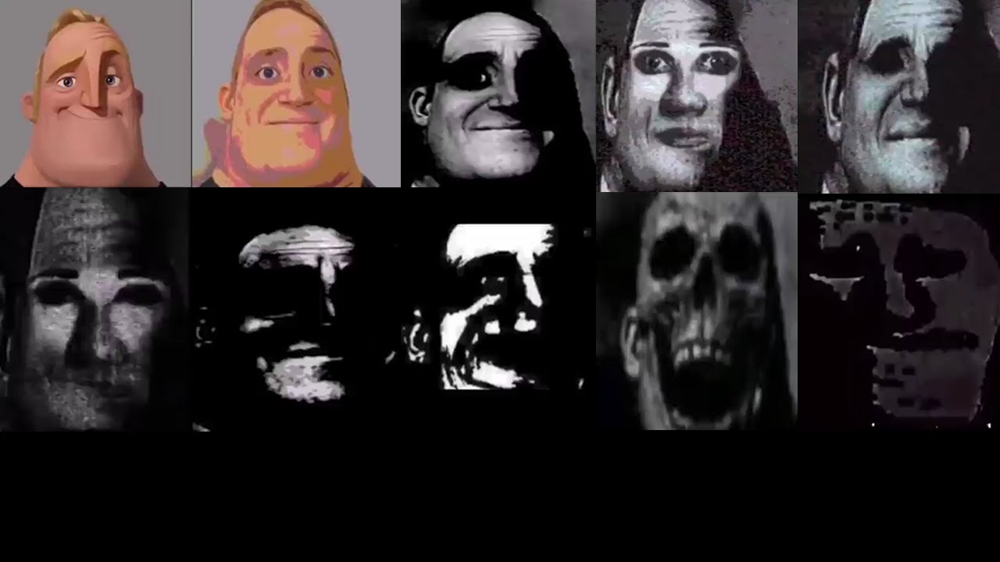